<a href="https://colab.research.google.com/github/MuhammedShiway/Graduation-Thesis/blob/main/Modified_DiffConv_%5BComplete%5D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import numpy as np
import torch.nn as nn
from torchvision import transforms
from PIL import Image

import torch
import numpy as np
import torch.nn as nn

#EXTREMES NORMALIZER
def normalize_ext(x):
  high = torch.max(x)
  low = torch.min(x)
  x = ((x-low) * high) / (high - low);
  return x

#NORMALIZER USING ONLY MAX
def normalize_max(x):
  high = torch.max(x)
  low = 0 - high
  x = ((x-low) * high) / (high - low);
  return x

#NORMALIZER USING DATA MAX
def normalize_data_max(x, data):
  high = torch.max(data)
  low = 0 - high
  x = ((x-low) * high) / (high - low);
  return x

#SIGMOID NORMALIZER
def normalize_sig(x):
  x = torch.sigmoid(x)
  return x

#MAX_SIGMOID NORMALIZER
def normalize_sig_max(x):
  high = torch.max(x)
  x = high / (1+ torch.exp(-x))
  return x

class DiffConv(nn.Module):

    def __init__(self):
        super(DiffConv, self).__init__()




    def forward(self, x, normalize):
        sizeofin = x.size()
        
        ins = sizeofin[0]
        n = sizeofin[1]
        sx = sizeofin[2]
        sy = sizeofin[3]  

        self.output = torch.zeros(ins,n*5,sx,sy)
        self.signInputs = torch.zeros(ins,n*5,sx,sy)
          
        x = x.to(torch.int16)
        for i in range(0,ins):

            
            oM = 0
            oN = n
            
            self.output[i,oM:oN,0:sx,0:sy]= x[i].clone()
            
            oM = n
            oN = 2*n

            #area = self.output[i,oM:oN,0:sx-1,0:sy]
            self.output[i,oM:oN,0:sx-1,0:sy] = self.output[i,oM:oN,0:sx-1,0:sy].add(x[i,0:n,0:sx-1,0:sy])
            self.output[i,oM:oN,0:sx-1,0:sy] = self.output[i,oM:oN,0:sx-1,0:sy].add(-x[i,0:n,1:sx,0:sy])

            oM = 2*n
            oN = 3*n

            #area = ptr[oM:oN,0:sx,0:sy-1]
            self.output[i,oM:oN,0:sx,0:sy-1]=self.output[i,oM:oN,0:sx,0:sy-1].add(x[i,0:n,0:sx,0:sy-1])
            self.output[i,oM:oN,0:sx,0:sy-1]=self.output[i,oM:oN,0:sx,0:sy-1].add(-x[i,0:n,0:sx,1:sy])
            
            oM = 3*n
            oN = 4*n

            #area = ptr[oM:oN,0:sx-1,0:sy-1]
            self.output[i,oM:oN,0:sx-1,0:sy-1]=self.output[i,oM:oN,0:sx-1,0:sy-1].add(x[i,0:n,0:sx-1,0:sy-1])
            self.output[i,oM:oN,0:sx-1,0:sy-1]=self.output[i,oM:oN,0:sx-1,0:sy-1].add(-x[i,0:n,1:sx,1:sy])

            oM = 4*n
            oN = 5*n
           
            #area = ptr[oM:oN,0:sx-1,0:sy-1]
            self.output[i,oM:oN,0:sx-1,0:sy-1]=self.output[i,oM:oN,0:sx-1,0:sy-1].add(x[i,0:n,1:sx,0:sy-1])
            self.output[i,oM:oN,0:sx-1,0:sy-1]=self.output[i,oM:oN,0:sx-1,0:sy-1].add(-x[i,0:n,0:sx-1,1:sy])
            

        oM = n
        oN = 5*n

           
        #self.signInputs = self.output.sign()
        #self.signInputs[0:ins,0:n,:,:] = torch.ones(ins,n,sx,sy)
        
        #Inplace error came from the line below
        #self.output[0:ins,oM:oN,:,:] = self.output[0:ins,oM:oN].abs()

        #No more in place error
  
        
        if normalize == 'abs':
          self.output[0:ins,oM:oN,:,:] = torch.abs(self.output[0:ins,oM:oN].clone().detach());
        elif normalize == 'ext':
          self.output[0:ins,oM:oN,:,:] = normalize_ext(self.output[0:ins,oM:oN].clone().detach() );
        elif normalize == 'max':
          self.output[0:ins,oM:oN,:,:] = normalize_max(self.output[0:ins,oM:oN].clone().detach());
        elif normalize == 'data_max':
          self.output[0:ins,oM:oN,:,:] = normalize_data_max(self.output[0:ins,oM:oN].clone().detach(), data = x);
        elif normalize == 'sig':
          self.output[0:ins,oM:oN,:,:] = normalize_sig(self.output[0:ins,oM:oN].clone().detach());
        elif normalize == 'sig_max':
          self.output[0:ins,oM:oN,:,:] = normalize_sig_max(self.output[0:ins,oM:oN].clone().detach());
        

        
        

        #print(self.output)
        self.output = self.output.to(torch.uint8)
        return self.output



### IMPORT A NEW IMAGE AND TEST THESE

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Minato 2.jpg to Minato 2.jpg
Saving Minato 3.jpg to Minato 3.jpg
Saving Minato 4.jpg to Minato 4.jpg
Saving Minato 5.jpg to Minato 5.jpg


In [ ]:
ip1 = '/content/Minato 1.png'
ip2 = '/content/Minato 2.jpg'
ip3 = '/content/Minato 3.jpg'
ip4 = '/content/Minato 4.jpg'
ip5 = '/content/Minato 5.jpg'

In [ ]:
img_path = ip3

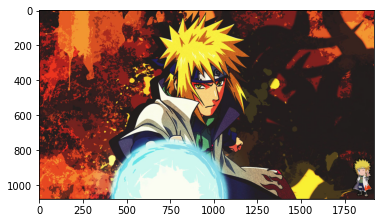

In [ ]:
img1 = mpimg.imread(img_path)
imgplot = plt.imshow(img1)
plt.show()

In [ ]:
from torchvision import transforms
from PIL import Image

In [ ]:
#Convert to TENSOR
transform = transforms.Compose([transforms.PILToTensor()])

In [ ]:
img_1 = Image.open(img_path)
img_tensor = transform(img_1)

In [ ]:
img_tensor.size()

torch.Size([3, 1080, 1920])

In [ ]:
#img_tensor.size()[0]

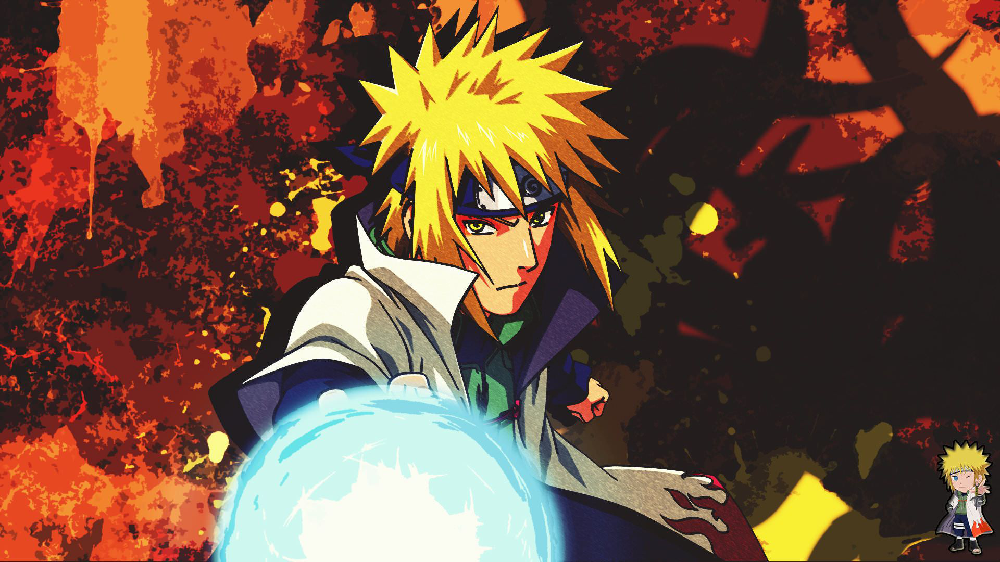

In [ ]:
img_1

In [ ]:
img_tensor[0][0]

tensor([36, 36, 36,  ..., 81, 73, 68], dtype=torch.uint8)

In [ ]:
torch.min(img_tensor)

tensor(0, dtype=torch.uint8)

In [ ]:
torch.max(img_tensor)

tensor(255, dtype=torch.uint8)

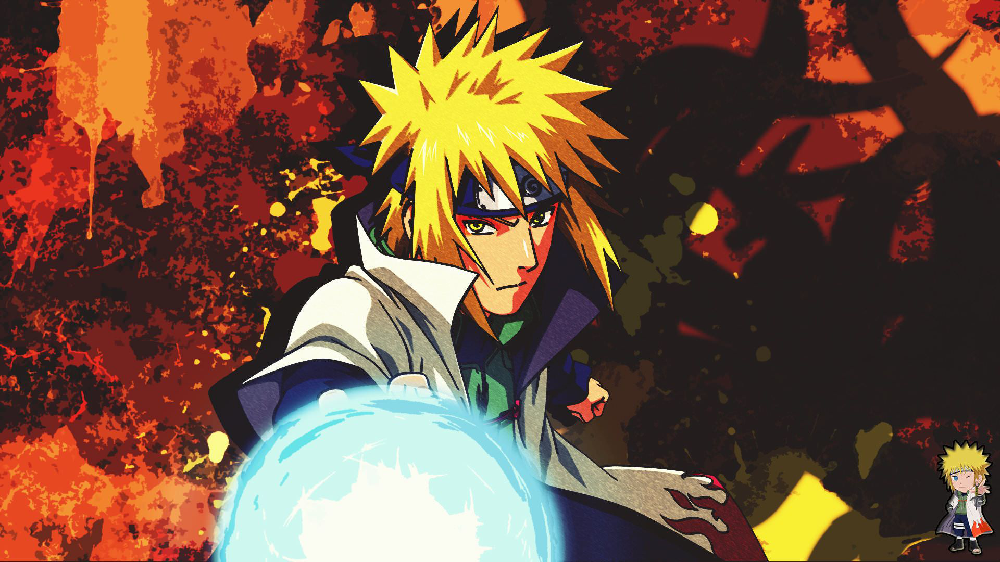

In [ ]:
r_transform = transforms.ToPILImage()
r_img = r_transform(img_tensor)
r_img

### APPLY DIFFCONV ON THE IMAGE

In [ ]:
p = DiffConv().cuda()

In [ ]:
img_tensor

tensor([[[ 36,  36,  36,  ...,  81,  73,  68],
         [ 36,  36,  36,  ..., 119, 112, 108],
         [ 36,  36,  36,  ..., 165, 159, 156],
         ...,
         [217, 217, 217,  ...,  44,  43,  42],
         [175, 175, 175,  ...,  41,  41,  41],
         [ 93,  93,  92,  ...,  39,  40,  40]],

        [[ 27,  27,  27,  ...,  29,  26,  24],
         [ 27,  27,  27,  ...,  36,  33,  30],
         [ 27,  27,  27,  ...,  36,  34,  33],
         ...,
         [ 76,  76,  76,  ...,  30,  29,  28],
         [ 75,  75,  75,  ...,  30,  30,  30],
         [  9,   9,  10,  ...,  30,  31,  31]],

        [[ 28,  28,  28,  ...,  18,  16,  13],
         [ 28,  28,  28,  ...,  32,  29,  26],
         [ 28,  28,  28,  ...,  41,  38,  38],
         ...,
         [ 46,  46,  46,  ...,  29,  26,  25],
         [ 52,  52,  52,  ...,  26,  26,  26],
         [  0,   0,   0,  ...,  25,  26,  26]]], dtype=torch.uint8)

In [ ]:
#img_tensor_1 = img_tensor.to(torch.int32)
#img_tensor_1

In [ ]:
img_tensor_2 = img_tensor.reshape(1, img_tensor.size()[0], img_tensor.size()[1], img_tensor.size()[2])

In [ ]:
img_tensor_2[0][0]

tensor([[ 36,  36,  36,  ...,  81,  73,  68],
        [ 36,  36,  36,  ..., 119, 112, 108],
        [ 36,  36,  36,  ..., 165, 159, 156],
        ...,
        [217, 217, 217,  ...,  44,  43,  42],
        [175, 175, 175,  ...,  41,  41,  41],
        [ 93,  93,  92,  ...,  39,  40,  40]], dtype=torch.uint8)

In [ ]:
torch.max(img_tensor_2)

tensor(255, dtype=torch.uint8)

In [ ]:
torch.min(img_tensor_2)

tensor(0, dtype=torch.uint8)

In [ ]:
img_tensor_3 = img_tensor_2 #.to(torch.int32)

In [ ]:
t = p.forward(img_tensor_3, normalize = 'ext');
t1 = p.forward(img_tensor_3, normalize = 'abs');
print(t.size())

torch.Size([1, 15, 1080, 1920])


In [ ]:
t1[0][0]

tensor([[ 36,  36,  36,  ...,  81,  73,  68],
        [ 36,  36,  36,  ..., 119, 112, 108],
        [ 36,  36,  36,  ..., 165, 159, 156],
        ...,
        [217, 217, 217,  ...,  44,  43,  42],
        [175, 175, 175,  ...,  41,  41,  41],
        [ 93,  93,  92,  ...,  39,  40,  40]], dtype=torch.uint8)

In [ ]:
t[0][0]

tensor([[ 36,  36,  36,  ...,  81,  73,  68],
        [ 36,  36,  36,  ..., 119, 112, 108],
        [ 36,  36,  36,  ..., 165, 159, 156],
        ...,
        [217, 217, 217,  ...,  44,  43,  42],
        [175, 175, 175,  ...,  41,  41,  41],
        [ 93,  93,  92,  ...,  39,  40,  40]], dtype=torch.uint8)

In [ ]:
(t- t1 ).sum()

tensor(3062885828)

In [ ]:
(t != t1).sum()

tensor(24882011)

In [ ]:
#t = t.to(torch.uint8)

In [ ]:
torch.max(t)

tensor(255, dtype=torch.uint8)

In [ ]:
#CHECK MIN OF OUTPUT
torch.min(t)

tensor(0, dtype=torch.uint8)

In [ ]:
torch.max(t1)

tensor(255, dtype=torch.uint8)

In [ ]:
torch.min(t1)

tensor(0, dtype=torch.uint8)

In [ ]:
samp = t

In [ ]:
#CONVERT SOME OF THE TENSORS TO IMAGES
r0 = r_transform(samp[0][0])
r1 = r_transform(samp[0][3])
r2 = r_transform(samp[0][6])
r3 = r_transform(samp[0][9])
r4 = r_transform(samp[0][14])

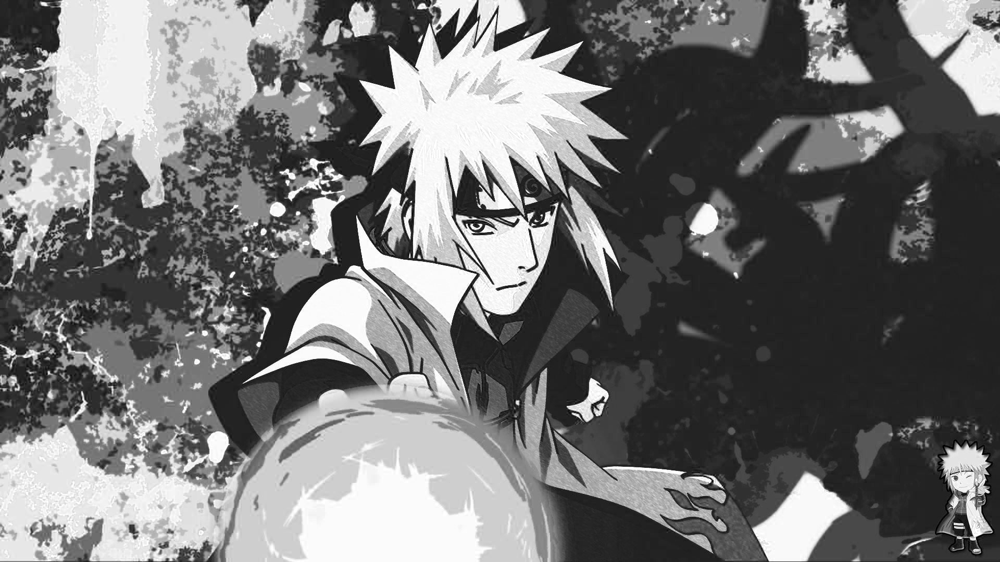

In [ ]:
r0

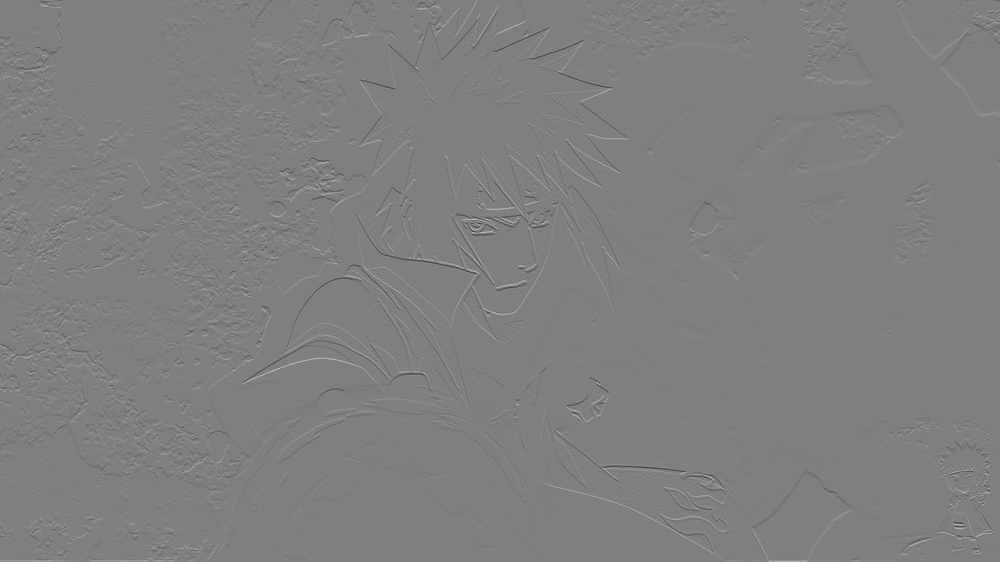

In [ ]:
r1

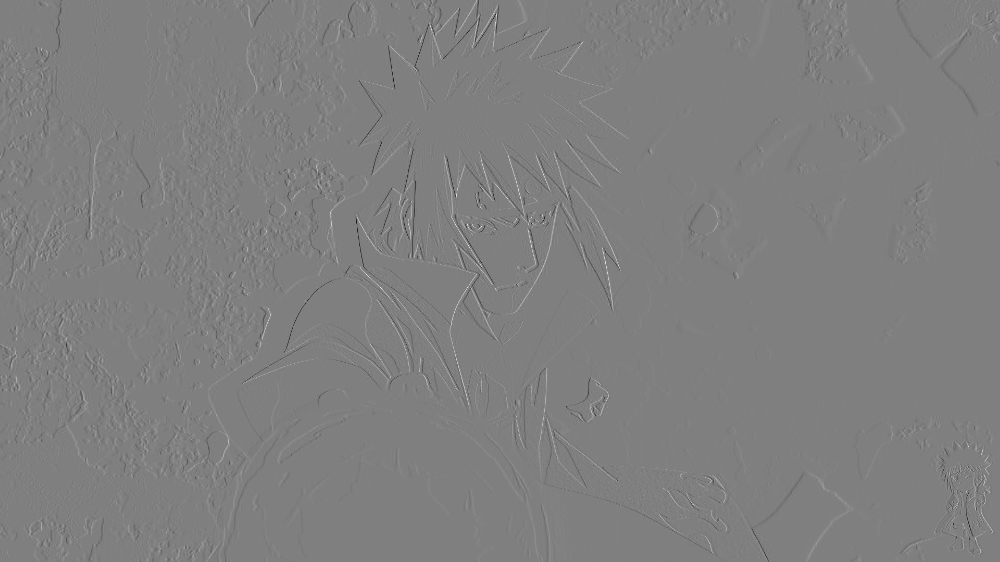

In [ ]:
r2

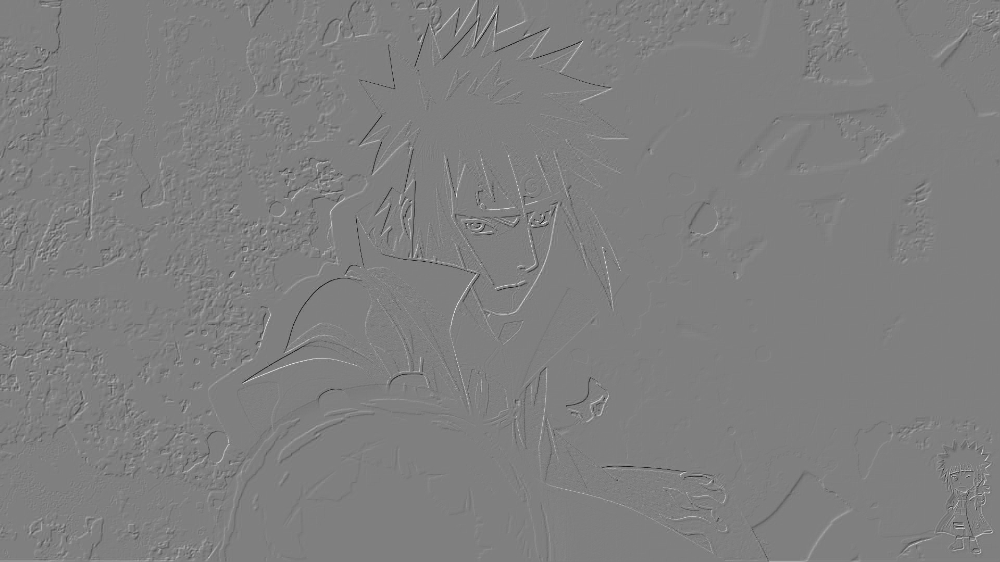

In [ ]:
r3

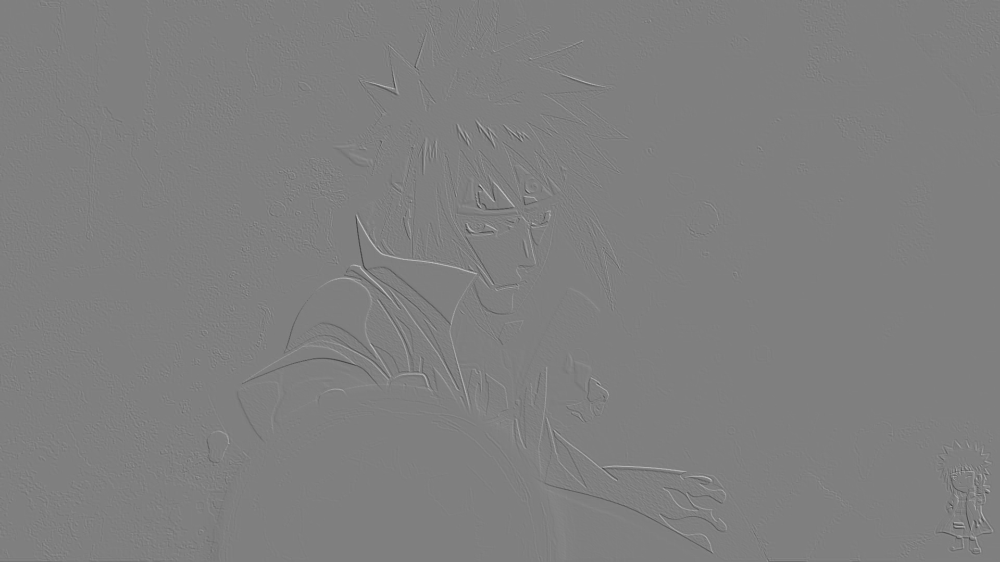

In [ ]:
r4

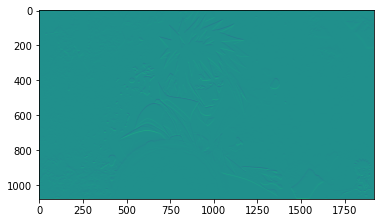

In [ ]:
a2 = t[0][4].cpu().detach().numpy()
a2_im = plt.imshow(a2)
plt.show()

### TYPECAST TO SIGNED INTEGER

In [ ]:
#img_tensor_3 = img_tensor_2.to(torch.int8)

In [ ]:
img_tensor_3

tensor([[[[ 36,  36,  36,  ...,  81,  73,  68],
          [ 36,  36,  36,  ..., 119, 112, 108],
          [ 36,  36,  36,  ..., 165, 159, 156],
          ...,
          [217, 217, 217,  ...,  44,  43,  42],
          [175, 175, 175,  ...,  41,  41,  41],
          [ 93,  93,  92,  ...,  39,  40,  40]],

         [[ 27,  27,  27,  ...,  29,  26,  24],
          [ 27,  27,  27,  ...,  36,  33,  30],
          [ 27,  27,  27,  ...,  36,  34,  33],
          ...,
          [ 76,  76,  76,  ...,  30,  29,  28],
          [ 75,  75,  75,  ...,  30,  30,  30],
          [  9,   9,  10,  ...,  30,  31,  31]],

         [[ 28,  28,  28,  ...,  18,  16,  13],
          [ 28,  28,  28,  ...,  32,  29,  26],
          [ 28,  28,  28,  ...,  41,  38,  38],
          ...,
          [ 46,  46,  46,  ...,  29,  26,  25],
          [ 52,  52,  52,  ...,  26,  26,  26],
          [  0,   0,   0,  ...,  25,  26,  26]]]], dtype=torch.uint8)